# Dog Vs. Cat Problem

__Designer & Provider:__ Mobin Nesari

## Unzip data

In [1]:
!unzip /kaggle/input/dogs-vs-cats/train.zip

Archive:  /kaggle/input/dogs-vs-cats/train.zip
   creating: train/
  inflating: train/cat.0.jpg         
  inflating: train/cat.1.jpg         
  inflating: train/cat.10.jpg        
  inflating: train/cat.100.jpg       
  inflating: train/cat.1000.jpg      
  inflating: train/cat.10000.jpg     
  inflating: train/cat.10001.jpg     
  inflating: train/cat.10002.jpg     
  inflating: train/cat.10003.jpg     
  inflating: train/cat.10004.jpg     
  inflating: train/cat.10005.jpg     
  inflating: train/cat.10006.jpg     
  inflating: train/cat.10007.jpg     
  inflating: train/cat.10008.jpg     
  inflating: train/cat.10009.jpg     
  inflating: train/cat.1001.jpg      
  inflating: train/cat.10010.jpg     
  inflating: train/cat.10011.jpg     
  inflating: train/cat.10012.jpg     
  inflating: train/cat.10013.jpg     
  inflating: train/cat.10014.jpg     
  inflating: train/cat.10015.jpg     
  inflating: train/cat.10016.jpg     
  inflating: train/cat.10017.jpg     
  inflating: train/ca

In [2]:
!unzip /kaggle/input/dogs-vs-cats/test1.zip

Archive:  /kaggle/input/dogs-vs-cats/test1.zip
   creating: test1/
  inflating: test1/1.jpg             
  inflating: test1/10.jpg            
  inflating: test1/100.jpg           
  inflating: test1/1000.jpg          
  inflating: test1/10000.jpg         
  inflating: test1/10001.jpg         
  inflating: test1/10002.jpg         
  inflating: test1/10003.jpg         
  inflating: test1/10004.jpg         
  inflating: test1/10005.jpg         
  inflating: test1/10006.jpg         
  inflating: test1/10007.jpg         
  inflating: test1/10008.jpg         
  inflating: test1/10009.jpg         
  inflating: test1/1001.jpg          
  inflating: test1/10010.jpg         
  inflating: test1/10011.jpg         
  inflating: test1/10012.jpg         
  inflating: test1/10013.jpg         
  inflating: test1/10014.jpg         
  inflating: test1/10015.jpg         
  inflating: test1/10016.jpg         
  inflating: test1/10017.jpg         
  inflating: test1/10018.jpg         
  inflating: test1/10

In [3]:
import glob
paths = glob.glob('/kaggle/working/train/*.jpg')
paths[:5]

['/kaggle/working/train/cat.2244.jpg',
 '/kaggle/working/train/dog.4058.jpg',
 '/kaggle/working/train/cat.3221.jpg',
 '/kaggle/working/train/cat.10549.jpg',
 '/kaggle/working/train/cat.9954.jpg']

In [4]:
cat_images = list(filter(lambda x : x.split('/')[-1].split('.')[0] == 'cat', paths))
dog_images = list(filter(lambda x : x.split('/')[-1].split('.')[0] == 'dog', paths))

In [5]:
train_size_cat = int(len(cat_images) * 0.8)
print(f'Train Cat Size: {train_size_cat}')
train_size_dog = int(len(dog_images) * 0.8)
print(f'Train Dog Size: {train_size_dog}')

Train Cat Size: 10000
Train Dog Size: 10000


## Augmentation

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
import os
from PIL import Image
from IPython.display import display

import warnings
warnings.filterwarnings('ignore')

(490, 499)


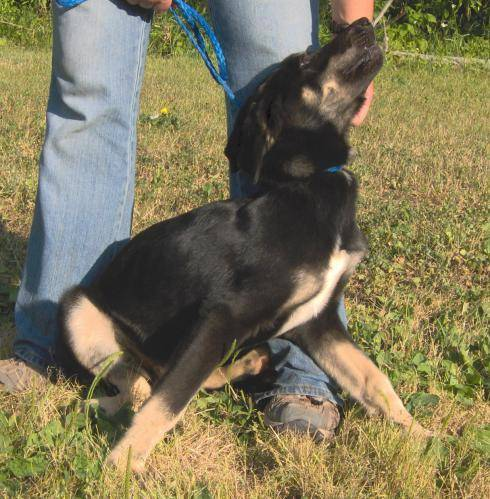

In [11]:
dog = Image.open('/kaggle/working/train/dog.1164.jpg')
print(dog.size)
display(dog)

In [12]:
r, g, b = dog.getpixel((0,0))
print(r, g, b)

140 153 71


torch.Size([3, 499, 490])


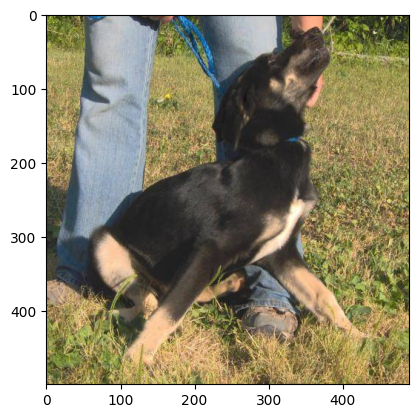

In [13]:
transform = transforms.Compose([
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)))

In [14]:
im[:, 0, 0]

tensor([0.5490, 0.6000, 0.2784])

In [17]:
71 / 255

0.2784313725490196

torch.Size([3, 228, 224])


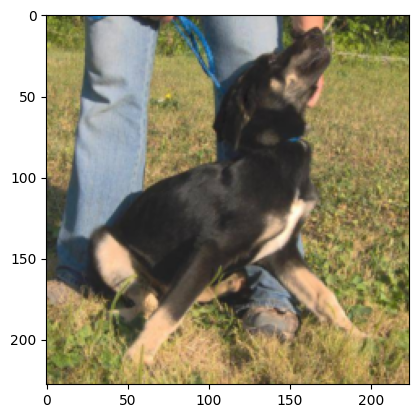

In [18]:
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)))

torch.Size([3, 224, 224])


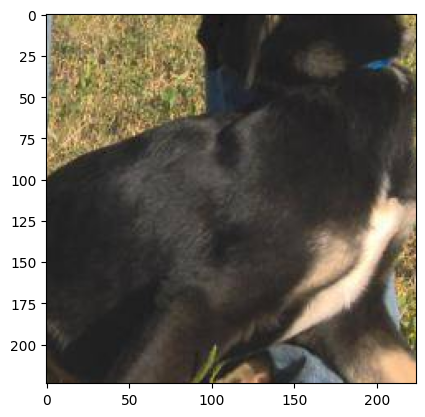

In [19]:
transform = transforms.Compose([
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)))
plt.show()

torch.Size([3, 180, 180])


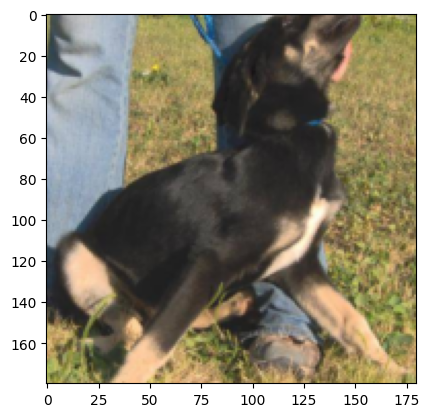

In [23]:
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(180),
    transforms.ToTensor()
])

im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)))
plt.show()

torch.Size([3, 499, 490])


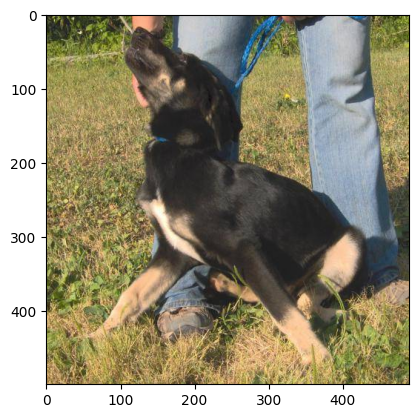

In [24]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)))
plt.show()

torch.Size([3, 180, 180])


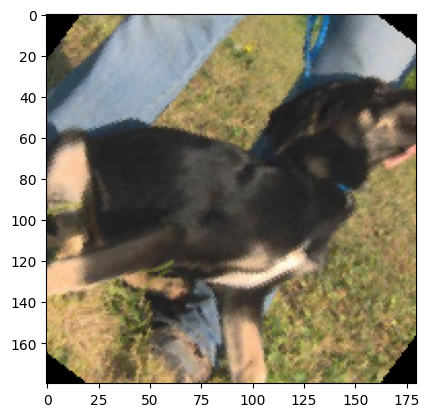

In [29]:
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomRotation(90),
    transforms.CenterCrop(180),
    transforms.ToTensor()
])

im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

torch.Size([3, 1000, 1000])


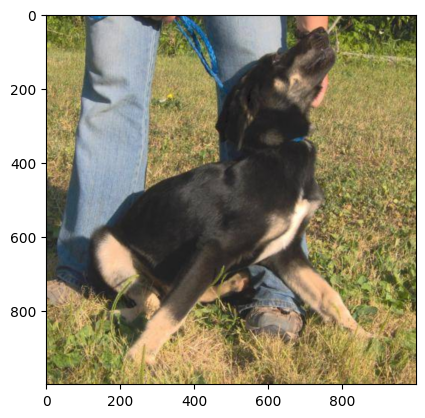

In [32]:
transform = transforms.Compose([
    transforms.Resize((1000, 1000)),
    transforms.ToTensor()
])

im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

torch.Size([3, 224, 224])


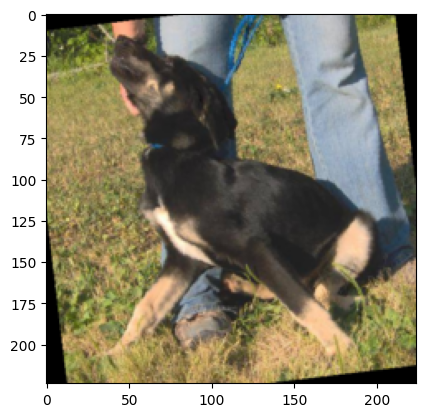

In [34]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=1),
    transforms.RandomRotation(30),
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])

im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

torch.Size([3, 499, 490])


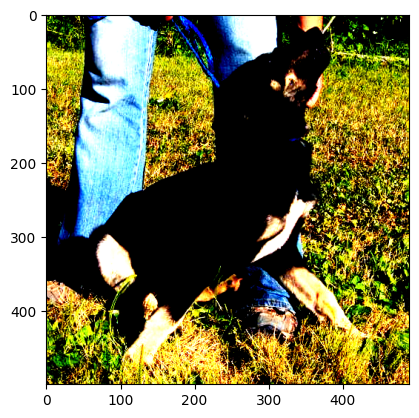

In [35]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

im = transform(dog)
print(im.shape)
plt.imshow(np.transpose(im.numpy(), (1, 2, 0)));

In [36]:
im[:, 0, 0]

tensor([ 0.2796,  0.6429, -0.5670])

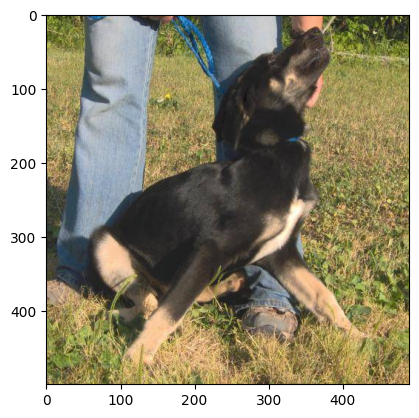

In [37]:
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

im_inv = inv_normalize(im)
plt.imshow(np.transpose(im_inv.numpy(), (1,2,0)));

## ResNet Model

Importing required libraries

In [6]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os
from collections import OrderedDict
import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
import torchvision

Downloading and using pretrained ResNet18

In [7]:
#download the pretrained model
import torchvision.models as models
model = models.resnet18(pretrained = True)

#switch device to gpu if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 152MB/s]


Setting Train & Test directory

In [8]:
train_dir = '/kaggle/working/train'
test_dir = '/kaggle/working/test1'
train_files = os.listdir(train_dir)
test_files = os.listdir(test_dir)

Implementing Dataset object

In [9]:
class CatDogDataset(Dataset):
    def __init__(self, file_list, dir, mode='train', transform = None):
        self.file_list = file_list
        self.dir = dir
        self.mode= mode
        self.transform = transform
        if self.mode == 'train':
            if 'dog' in self.file_list[0]:
                self.label = 1
            else:
                self.label = 0
            
    def __len__(self):
        return len(self.file_list)
    
    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.dir, self.file_list[idx]))
        if self.transform:
            img = self.transform(img)
        if self.mode == 'train':
            img = img.numpy()
            return img.astype('float32'), self.label
        else:
            img = img.numpy()
            return img.astype('float32'), self.file_list[idx]
        

Composing image transformations

In [10]:
data_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.ColorJitter(),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.Resize(128),
    transforms.ToTensor()
])

Initiating datasets

In [11]:
cat_files = [tf for tf in train_files if 'cat' in tf]
dog_files = [tf for tf in train_files if 'dog' in tf]

cats = CatDogDataset(cat_files, train_dir, transform = data_transform)
dogs = CatDogDataset(dog_files, train_dir, transform = data_transform)

catdogs = ConcatDataset([cats, dogs])

In [12]:
dataloader = DataLoader(catdogs, batch_size = 64, shuffle=True, num_workers=4)

Visualize some samples from images

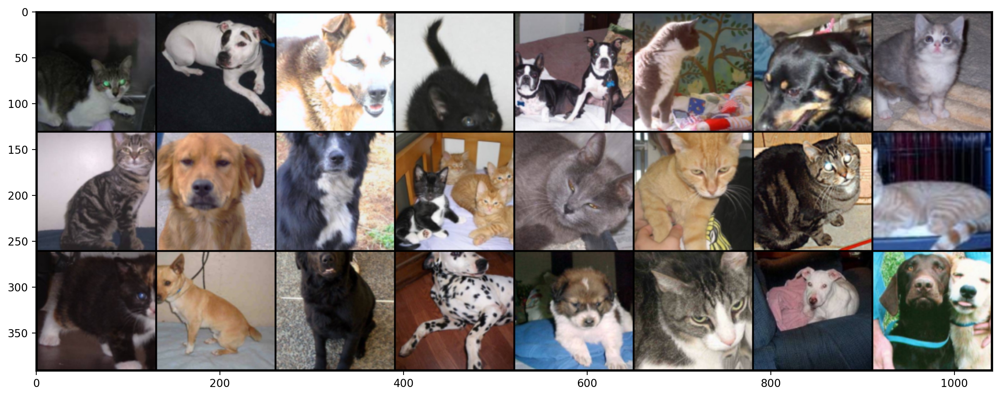

In [13]:
samples, labels = iter(dataloader).__next__()
plt.figure(figsize=(16,24))
grid_imgs = torchvision.utils.make_grid(samples[:24])
np_grid_imgs = grid_imgs.numpy()
# in tensor, image is (batch, width, height), so you have to transpose it to (width, height, batch) in numpy to show it.
plt.imshow(np.transpose(np_grid_imgs, (1,2,0)))

Freezing model parameters

In [14]:
# Freeze the parameters 
for param in model.parameters():
    param.requires_grad = False 

New Fully Connected setup to fullfil the task

In [15]:
#Classifier architecture to put on top of resnet18
fc = nn.Sequential(OrderedDict([
    ('fc1', nn.Linear(512,100)),
    ('relu', nn.ReLU()),
    ('fc2', nn.Linear(100,2)),
    ('output', nn.LogSoftmax(dim=1))
]))

model.fc = fc

Moving model to desired device

In [16]:
#shifting model to gpu
model = model.to(device)

Training Function

In [17]:
#function to train the model
def train(model, trainloader, criterion, optimizer, epochs = 5):
    train_loss =[]
    for e in range(epochs):
        running_loss =0
        for images, labels in trainloader:
            inputs, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            img = model(inputs)
            
            loss = criterion(img, labels)
            running_loss+=loss
            loss.backward()
            optimizer.step()
        print("Epoch : {}/{}..".format(e+1,epochs),
         "Training Loss: {:.6f}".format(running_loss/len(trainloader))) 
        train_loss.append(running_loss.item())
    plt.plot(train_loss,label="Training Loss")
    plt.show()     

Training Procedure

Epoch : 1/5.. Training Loss: 0.194037
Epoch : 2/5.. Training Loss: 0.163950
Epoch : 3/5.. Training Loss: 0.152097
Epoch : 4/5.. Training Loss: 0.150541
Epoch : 5/5.. Training Loss: 0.141691


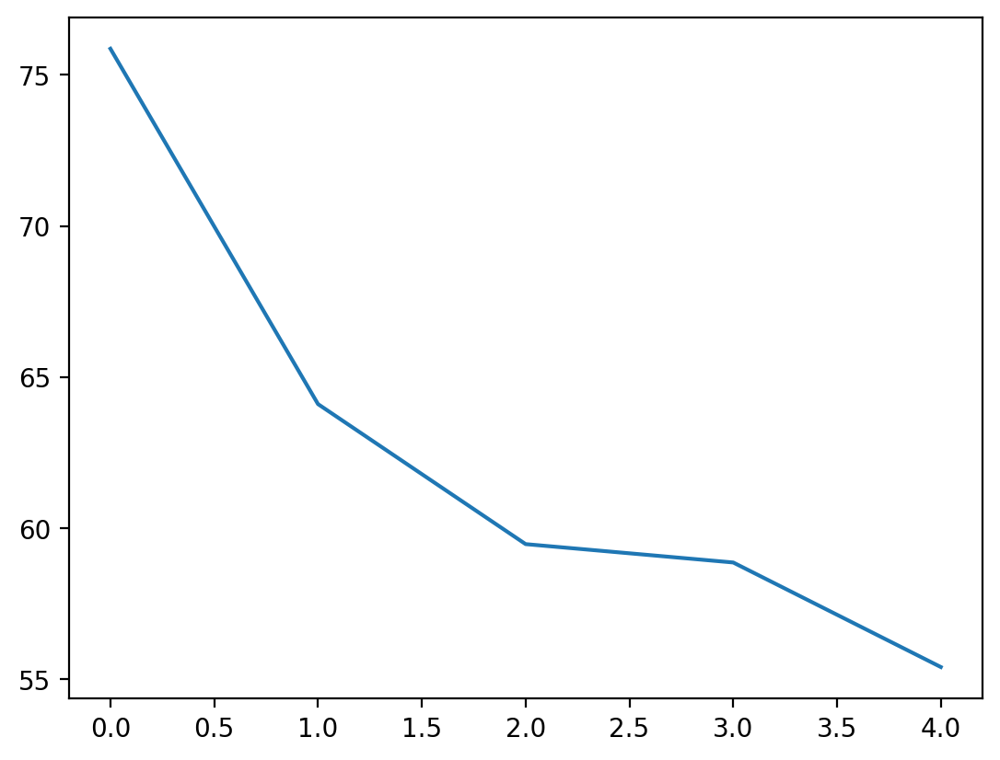

In [18]:
epochs = 5
model.train()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)
criterion = nn.NLLLoss()    
train(model,dataloader,criterion, optimizer, epochs)

Saving model and perform test transform

In [19]:
#Save the model
filename_pth = 'ckpt_resnet18_catdog.pth'
torch.save(model.state_dict(), filename_pth)


#Transform the test dataset
test_transform = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor()
])

testset = CatDogDataset(test_files, test_dir, mode='test', transform = test_transform)
testloader = DataLoader(testset, batch_size = 64, shuffle=False, num_workers=4)

Test model and save results in a csv file

In [20]:
model.eval()
fn_list = []
pred_list = []
for x, fn in testloader:
    with torch.no_grad():
        x = x.to(device)
        output = model(x)
        pred = torch.argmax(output, dim=1)
        fn_list += [n[:-4] for n in fn]
        pred_list += [p.item() for p in pred]

submission = pd.DataFrame({"id":fn_list, "label":pred_list})
submission.to_csv('preds_resnet18.csv', index=False)

Visualize some samples from test dataset with model's prediction

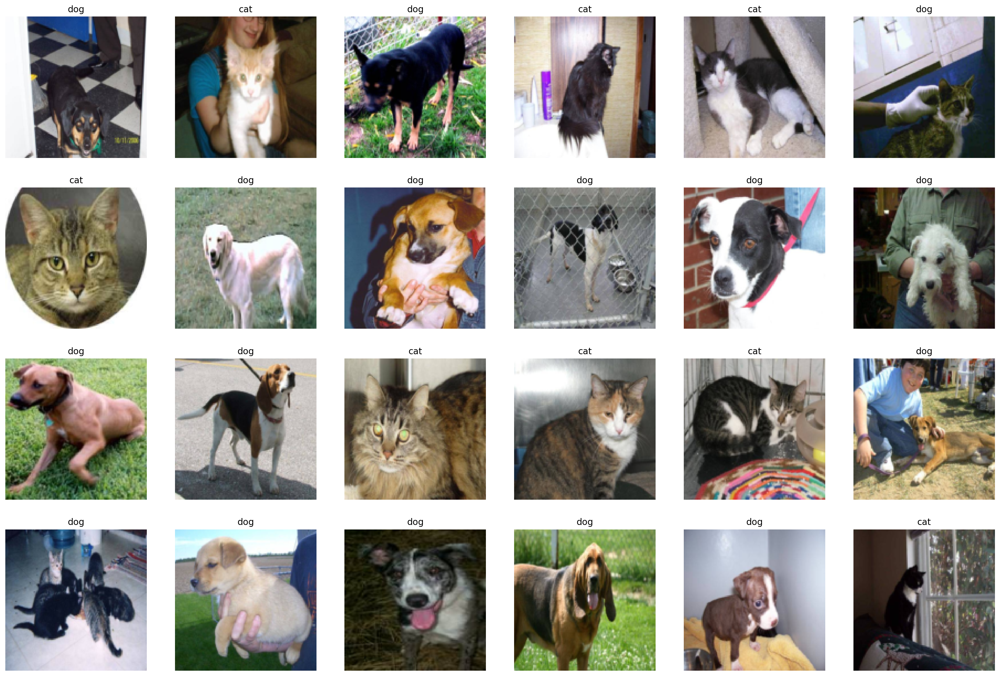

In [21]:
samples, _ = iter(testloader).__next__()
samples = samples.to(device)
fig = plt.figure(figsize=(24, 16))
fig.tight_layout()
output = model(samples[:24])
pred = torch.argmax(output, dim=1)
pred = [p.item() for p in pred]
ad = {0:'cat', 1:'dog'}
for num, sample in enumerate(samples[:24]):
    plt.subplot(4,6,num+1)
    plt.title(ad[pred[num]])
    plt.axis('off')
    sample = sample.cpu().numpy()
    plt.imshow(np.transpose(sample, (1,2,0)))